In [1]:
from Bio import SeqIO
from Bio import pairwise2
from Bio.pairwise2 import format_alignment
import sys
from Bio import AlignIO
from Bio.Align import AlignInfo
import numpy as np
import matplotlib.pyplot as plt
import os
from Bio.Align.Applications import ClustalwCommandline
import operator

In [2]:
def alignmentScore(alignment,x,y):
    xaxis=[]
    yaxis=[]
    flag=True
    mismatchCounter=0
    s=''
    for i in range(x-1):
        for j in range(y-1):
            if j!=y-1:
                if alignment[j][i]!=alignment[j+1][i]:
                    for k in range(y):                        
                        s=s+alignment[k, i]
                    ss=s.replace('-', '')
                    if len(ss)>1:
                        if len(set(ss)) != 1:
                            # we print out the mismatch position with adding 1 because gene index statring with 1 not 0
                           
                            xaxis.append(i)
                            yaxis.append(len(s))
                            print(i+1,':',s)
                            mismatchCounter=mismatchCounter+1

                    s=''
                    break

    misatchedScore    = round(mismatchCounter/x*100,1)
    matchedScore = round( (np.size(alignment,1) -mismatchCounter)/x  *100, 1)

    print('\n')
    print ("Mismatched Score =", misatchedScore ,"%", "(", mismatchCounter, " out of ",x ,")")
    print ("Matched Score =", matchedScore ,"%", "(", x-mismatchCounter, " out of ",x ,")") 
    time = [0, 1, 2, 3]

    
    plt.figure(figsize=(17, 5))
    plt.plot(xaxis, yaxis,'ro')
    plt.xlabel('Base position (The red dots show where the diffrence occures in the sequnces)')
    plt.ylabel('Base')
  
    

In [3]:
def mutationPercent(alignment,x,y,RefSeq):
    flag=True
    mismatchCounter=0
    s=''
    mutationsPecrent={}
    for i in range(x-1):
        for j in range(y-1):
            if j!=y-1:
                if alignment[j][i]!=alignment[j+1][i]:
                    for k in range(y):                        
                        s=s+alignment[k, i]
                    ss=s.replace('-', '')
                    if len(ss)>1:
                        if len(set(ss)) != 1:
  #print(i+1,':',s)
                            mutationsPecrent[i+1]=char_frequency(ss,RefSeq[i],y)
                            #print()
                            #print(i+1,char_frequency(s,alignment[0,i],y-1))
                            #mismatchCounter=mismatchCounter+1

                    s=''
                    break
                    
    sort_orders = sorted(mutationsPecrent.items(), key=lambda x: x[1], reverse=True)
    
    for i in sort_orders:
            print(i[0],'>>', i[1],'%')

    


In [4]:
def findConsensus(alignment,x,y):
    
    mismatchCounter=0
    s=''
    concensusnSeq=''
    mutationsPecrent={}
    for i in range(x):
        for j in range(y):           
            s=s+alignment[j, i]
        concensusnSeq+=char_frequency1(s)   
        #print(s)    
        s=''
    return(concensusnSeq)    
  
                    
    


In [5]:
def char_frequency(str1,consensusBase,mutationLen):
    dict = {}
    for n in str1:
        keys = dict.keys()
        if n in keys:
            dict[n] += 1
        else:
            dict[n] = 1
    sum=0
    for i in  dict:
        if(i!=consensusBase):
            sum=sum+dict[i]
    return(  round(sum/mutationLen*100,1))  
#print(char_frequency('google.com'))

In [6]:
def char_frequency1(str1):
    dict = {}
    for n in str1:
        keys = dict.keys()
        if n in keys:
            dict[n] += 1
        else:
            dict[n] = 1
  
    return(max(dict.items(), key=operator.itemgetter(1))[0])  
#print(char_frequency('google.com'))

# German

In [7]:

# Redigne Multialignmet file that we've generated
germanMultiAlignment = AlignIO.read("MiltiAlignment Files\German.aln", "clustal")

print("Alignment length %i" % germanMultiAlignment.get_alignment_length())
print("Samples",np.size(germanMultiAlignment,0)-1,)
print("\n")
for record in germanMultiAlignment:
    print("%s - %s" % (record.seq, record.id))
np.size(germanMultiAlignment,1)
#testAlignment[1,91]

Alignment length 29903
Samples 76


------------------------------------------------------AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTTGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAA

29903

In [30]:
row=np.size (germanMultiAlignment,0)
#germanMultiAlignment[1][14408]
for j in range(row-1):
    print(germanMultiAlignment[j][14407])


T
T
C
T
T
C
T
T
C
C
C
C
C
C
C
C
C
C
C
C
C
C
C
T
C
T
T
C
T
T
T
C
T
T
T
T
T
T
C
T
T
T
C
T
T
T
Y
T
T
T
T
T
T
T
T
T
T
T
T
T
C
C
Y
C
T
T
T
C
C
C
C
C
C
C
C
C


In [18]:
colum=np.size (germanMultiAlignment,1)
row=np.size (germanMultiAlignment,0)
for i in range(colum-1):
    for j in range(row-1):
        if j!=row-1:
            germanMultiAlignment[j][1]

### Finding concensus

In [8]:
colum=np.size (germanMultiAlignment,1)
row=np.size (germanMultiAlignment,0)

s=findConsensus(germanMultiAlignment,colum,row)
#print(s[5])
print(findConsensus(germanMultiAlignment,colum,row),'| Consensus')


------------------------------------------------------AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTTGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAACATGAGCATGAAATTGCTTGGTACACGGAACGTTCT

'-'

### Finding mutation

4 : -AAAAAAA-----A--------R------------------------------------------------------
160 : GAGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
210 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGKGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
241 : TTCTTCTTTTTTTTTTTTTTTTCTCTTCTTTCTTTTTTCTTTCTTTCTTTTTTTTTTTTTCCYCTTTCCCCCCCCCC
514 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTYTTTTTTTTTTTTTT
658 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTCTCCTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
675 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGGGGGGG
682 : TTTTTTTTTTTTTTTTTTTTTTKTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
884 : CCCCCCCCCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
900 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
1059 : TCCCCCCCCCCCCCCCCCCCCCCCCTCCTCTCCCTTCTCTTCCCCTCCTTTTTTTTTTCTCCYCCTCCCCCCCCCCC
1397 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGAGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG

4926 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAA
4927 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCCCCC
4928 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAA
4929 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAA
4930 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTT
4931 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCCCCC
4932 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTT
4933 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTT
4934 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAA
4935 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAA
4936 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNGGGGGG
4937 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA

5533 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAANAAANAA
5534 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCNCCCNCC
5535 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAANAAANAA
5536 : NAAAAAAAAAAAAAAAAAAAAAANNNNNAAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAANAAANAA
5537 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNCCCCNCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCNCCCNCC
5538 : NAAAAAAAAAAAAAAAAAAAAAANNNNNAAAANANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAANAAANAA
5539 : NGGGGGGGGGGGGGGGGGGGGGGNNNNNGGGGNGNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGNGGGNGG
5540 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNCCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCNCCCNCC
5541 : NAAAAAAAAAAAAAAAAAAAAAANNNNNAAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAANAAANAA
5542 : NGGGGGGGGGGGGGGGGGGGGGGNNNNNGGGGNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGNGGGNGG
5543 : NAAAAAAAAAAAAAAAAAAAAAANNNNNAAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAANAAANAA
5544 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNCCCCNCCCCCCCCCCCCCCCCCCCCCCCCC

19839 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
20020 : TTTTTTTTTTTTTTTTTTTTTYTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
20887 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGAGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
21137 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
21372 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGKGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
21627 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
21635 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCN
21707 : CCCCCCCCCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
22104 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGGG
22323 : CCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTTCCYCCT
22325 : NTTTTTTTTTTTTTTTTTTTTTTNNTNTNTTTNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
22326 : NCCCCCCCCCCCCCCCCCCCCCCNNCNCNCCCNCCCCCCCCCCCCC

22878 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
22879 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCNCNCCCC
22880 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
22881 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
22882 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
22883 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCNCNCCCC
22884 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
22885 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
22886 : NGGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNGGNGNGGGG
22887 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
22888 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
22889 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTT

23110 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
23111 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCNCNCCCC
23112 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
23113 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
23114 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCNCNCCCC
23115 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
23116 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
23117 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCNCNCCCC
23118 : NAAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAANANAAAA
23119 : NTTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTNTNTTTT
23120 : NGGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNGGNGNGGGG
23121 : NCCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCC

28549 : AAAAAAAAAAAAAAAAAAAAARAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
28629 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCTTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
28688 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTCTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
28830 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
28854 : CCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
28881 : GAGAAGAGGGGGGGGGGGGGGGGGGGGGGGGGAGGGAGGGGGGGGGRGGGRGGGGGGGAGGGGGAGAGGGGGGGGGG
28882 : GAGAAGAGGGGGGGGGGGGGGGGGGGGGGGGGAGGGAGGGGGGGGGRGGGRGGGGGGGAGGGGGAGAGGGGGGGGGG
28883 : GCGCCGCGGGGGGGGGGGGGGGGGGGGGGGGGCGGGCGGGGGGGGGSGGGSGGGGGGGCGGGGGCGCGGGGGGGGGG
28961 : CCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
29422 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGTGGGGKGGGGGGGGGGGKGGGGGGGGGGGGGG
29540 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGTGGGGGGGGGGGG
29546 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC

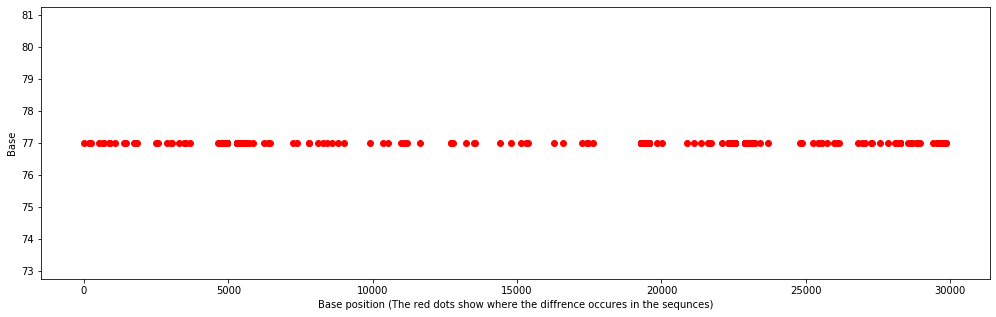

In [9]:
alignmentScore(germanMultiAlignment,colum,row)

### Mutation Percentage

In [10]:
# we choose Consensus sequnece as refrence sequence
refSeq=findConsensus(germanMultiAlignment,colum,row)
mutationPercent(germanMultiAlignment,colum,row,refSeq)

14408 >> 48.1 %
241 >> 29.9 %
1059 >> 29.9 %
3037 >> 29.9 %
23403 >> 29.9 %
25563 >> 29.9 %
1440 >> 19.5 %
2891 >> 19.5 %
5297 >> 19.5 %
5303 >> 19.5 %
5304 >> 19.5 %
5305 >> 19.5 %
5313 >> 19.5 %
5314 >> 19.5 %
5336 >> 19.5 %
5300 >> 18.2 %
5302 >> 18.2 %
5308 >> 18.2 %
5311 >> 18.2 %
5318 >> 18.2 %
5319 >> 18.2 %
5324 >> 18.2 %
5325 >> 18.2 %
5330 >> 18.2 %
5331 >> 18.2 %
5332 >> 18.2 %
5338 >> 18.2 %
5342 >> 18.2 %
5343 >> 18.2 %
5344 >> 18.2 %
5345 >> 18.2 %
5349 >> 18.2 %
5350 >> 18.2 %
5354 >> 18.2 %
5356 >> 18.2 %
5359 >> 18.2 %
5360 >> 18.2 %
5361 >> 18.2 %
5369 >> 18.2 %
5371 >> 18.2 %
5393 >> 18.2 %
5498 >> 18.2 %
23104 >> 18.2 %
23144 >> 18.2 %
5298 >> 16.9 %
5299 >> 16.9 %
5301 >> 16.9 %
5306 >> 16.9 %
5307 >> 16.9 %
5309 >> 16.9 %
5310 >> 16.9 %
5312 >> 16.9 %
5315 >> 16.9 %
5316 >> 16.9 %
5317 >> 16.9 %
5320 >> 16.9 %
5321 >> 16.9 %
5322 >> 16.9 %
5323 >> 16.9 %
5326 >> 16.9 %
5327 >> 16.9 %
5328 >> 16.9 %
5329 >> 16.9 %
5333 >> 16.9 %
5334 >> 16.9 %
5335 >> 16.9 %
5337 >

19362 >> 10.4 %
19363 >> 10.4 %
19364 >> 10.4 %
19365 >> 10.4 %
19366 >> 10.4 %
19367 >> 10.4 %
19368 >> 10.4 %
19369 >> 10.4 %
19370 >> 10.4 %
19371 >> 10.4 %
19372 >> 10.4 %
19373 >> 10.4 %
19374 >> 10.4 %
19375 >> 10.4 %
19376 >> 10.4 %
19377 >> 10.4 %
19378 >> 10.4 %
19379 >> 10.4 %
19380 >> 10.4 %
19381 >> 10.4 %
19382 >> 10.4 %
19383 >> 10.4 %
19384 >> 10.4 %
19385 >> 10.4 %
19386 >> 10.4 %
19387 >> 10.4 %
19388 >> 10.4 %
19389 >> 10.4 %
19390 >> 10.4 %
19391 >> 10.4 %
19392 >> 10.4 %
19395 >> 10.4 %
19396 >> 10.4 %
19397 >> 10.4 %
19398 >> 10.4 %
19399 >> 10.4 %
19400 >> 10.4 %
19401 >> 10.4 %
19402 >> 10.4 %
19403 >> 10.4 %
19404 >> 10.4 %
19405 >> 10.4 %
19406 >> 10.4 %
19407 >> 10.4 %
19408 >> 10.4 %
19409 >> 10.4 %
19410 >> 10.4 %
19411 >> 10.4 %
19412 >> 10.4 %
19413 >> 10.4 %
19414 >> 10.4 %
19415 >> 10.4 %
19416 >> 10.4 %
19417 >> 10.4 %
19418 >> 10.4 %
19419 >> 10.4 %
19420 >> 10.4 %
19421 >> 10.4 %
19422 >> 10.4 %
19423 >> 10.4 %
19424 >> 10.4 %
19425 >> 10.4 %
19426 >>

25429 >> 1.3 %
25466 >> 1.3 %
25719 >> 1.3 %
25975 >> 1.3 %
26088 >> 1.3 %
26801 >> 1.3 %
26936 >> 1.3 %
27046 >> 1.3 %
27272 >> 1.3 %
27299 >> 1.3 %
27577 >> 1.3 %
27849 >> 1.3 %
28101 >> 1.3 %
28144 >> 1.3 %
28222 >> 1.3 %
28223 >> 1.3 %
28224 >> 1.3 %
28225 >> 1.3 %
28226 >> 1.3 %
28227 >> 1.3 %
28228 >> 1.3 %
28229 >> 1.3 %
28230 >> 1.3 %
28231 >> 1.3 %
28232 >> 1.3 %
28233 >> 1.3 %
28234 >> 1.3 %
28235 >> 1.3 %
28236 >> 1.3 %
28237 >> 1.3 %
28238 >> 1.3 %
28239 >> 1.3 %
28240 >> 1.3 %
28241 >> 1.3 %
28242 >> 1.3 %
28243 >> 1.3 %
28244 >> 1.3 %
28245 >> 1.3 %
28246 >> 1.3 %
28247 >> 1.3 %
28248 >> 1.3 %
28249 >> 1.3 %
28250 >> 1.3 %
28251 >> 1.3 %
28252 >> 1.3 %
28253 >> 1.3 %
28254 >> 1.3 %
28255 >> 1.3 %
28256 >> 1.3 %
28257 >> 1.3 %
28258 >> 1.3 %
28259 >> 1.3 %
28260 >> 1.3 %
28261 >> 1.3 %
28549 >> 1.3 %
28688 >> 1.3 %
28830 >> 1.3 %
28854 >> 1.3 %
28961 >> 1.3 %
29540 >> 1.3 %
29648 >> 1.3 %
29680 >> 1.3 %
29700 >> 1.3 %
29705 >> 1.3 %
29708 >> 1.3 %
29711 >> 1.3 %
29718 >> 1

## German With (Chinese as Ref)

In [11]:
# Redigne Multialignmet file that we've generated
germanWithChineseMultiAlignment = AlignIO.read("MiltiAlignment Files\German with chinese.aln", "clustal")

print("Alignment length %i" % germanWithChineseMultiAlignment.get_alignment_length())
print("Samples",np.size(germanWithChineseMultiAlignment,0)-1,)
print("\n")
for record in germanWithChineseMultiAlignment:
    print("%s - %s" % (record.seq, record.id))
np.size(germanWithChineseMultiAlignment,1)
#testAlignment[1,91]


Alignment length 29903
Samples 77


ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAA

29903

In [29]:
row=np.size (germanWithChineseMultiAlignment,0)
#germanMultiAlignment[1][14408]
for j in range(row-1):
    print(germanWithChineseMultiAlignment[j][14407])

C
C
C
T
T
C
T
T
T
C
C
C
C
C
C
C
C
C
C
C
C
C
C
T
C
T
T
C
T
T
T
C
T
T
T
T
T
T
C
T
T
T
C
T
T
T
Y
T
T
T
T
T
T
T
T
T
T
T
T
T
C
C
Y
C
T
T
T
T
C
C
C
C
C
C
C
C
C


### Mutation Percentage
      

In [38]:

# we choose Chinese sequnece as refrence sequence
for record in germanWithChineseMultiAlignment:
    s="%s" % (record.id)
    if s=='NC_045512.2':
        chineseSeq="%s" % (record.seq)
        break

refSeq=chineseSeq
mutationPercent(germanWithChineseMultiAlignment,colum,row,refSeq)

3037 >> 72.7 %
23403 >> 72.7 %
241 >> 71.4 %
14408 >> 54.5 %
1059 >> 29.9 %
25563 >> 29.9 %
5297 >> 19.5 %
5303 >> 19.5 %
5304 >> 19.5 %
5305 >> 19.5 %
5313 >> 19.5 %
5314 >> 19.5 %
5336 >> 19.5 %
1440 >> 18.2 %
2891 >> 18.2 %
5300 >> 18.2 %
5302 >> 18.2 %
5308 >> 18.2 %
5311 >> 18.2 %
5318 >> 18.2 %
5319 >> 18.2 %
5324 >> 18.2 %
5325 >> 18.2 %
5330 >> 18.2 %
5331 >> 18.2 %
5332 >> 18.2 %
5338 >> 18.2 %
5342 >> 18.2 %
5343 >> 18.2 %
5344 >> 18.2 %
5345 >> 18.2 %
5349 >> 18.2 %
5350 >> 18.2 %
5354 >> 18.2 %
5356 >> 18.2 %
5359 >> 18.2 %
5360 >> 18.2 %
5361 >> 18.2 %
5369 >> 18.2 %
5371 >> 18.2 %
5393 >> 18.2 %
5498 >> 18.2 %
23104 >> 18.2 %
23144 >> 18.2 %
5298 >> 16.9 %
5299 >> 16.9 %
5301 >> 16.9 %
5306 >> 16.9 %
5307 >> 16.9 %
5309 >> 16.9 %
5310 >> 16.9 %
5312 >> 16.9 %
5315 >> 16.9 %
5316 >> 16.9 %
5317 >> 16.9 %
5320 >> 16.9 %
5321 >> 16.9 %
5322 >> 16.9 %
5323 >> 16.9 %
5326 >> 16.9 %
5327 >> 16.9 %
5328 >> 16.9 %
5329 >> 16.9 %
5333 >> 16.9 %
5334 >> 16.9 %
5335 >> 16.9 %
5337 >

19405 >> 10.4 %
19406 >> 10.4 %
19407 >> 10.4 %
19408 >> 10.4 %
19409 >> 10.4 %
19410 >> 10.4 %
19411 >> 10.4 %
19412 >> 10.4 %
19413 >> 10.4 %
19414 >> 10.4 %
19415 >> 10.4 %
19416 >> 10.4 %
19417 >> 10.4 %
19418 >> 10.4 %
19419 >> 10.4 %
19420 >> 10.4 %
19421 >> 10.4 %
19422 >> 10.4 %
19423 >> 10.4 %
19424 >> 10.4 %
19425 >> 10.4 %
19426 >> 10.4 %
19427 >> 10.4 %
19428 >> 10.4 %
19429 >> 10.4 %
19430 >> 10.4 %
19431 >> 10.4 %
19432 >> 10.4 %
19433 >> 10.4 %
19434 >> 10.4 %
19435 >> 10.4 %
19436 >> 10.4 %
19437 >> 10.4 %
19438 >> 10.4 %
19439 >> 10.4 %
19440 >> 10.4 %
19441 >> 10.4 %
19442 >> 10.4 %
19443 >> 10.4 %
19444 >> 10.4 %
19445 >> 10.4 %
19446 >> 10.4 %
19447 >> 10.4 %
19448 >> 10.4 %
19449 >> 10.4 %
19450 >> 10.4 %
19451 >> 10.4 %
19452 >> 10.4 %
19453 >> 10.4 %
19454 >> 10.4 %
19455 >> 10.4 %
19456 >> 10.4 %
19457 >> 10.4 %
19458 >> 10.4 %
19459 >> 10.4 %
19460 >> 10.4 %
19461 >> 10.4 %
19462 >> 10.4 %
19463 >> 10.4 %
19464 >> 10.4 %
19465 >> 10.4 %
19466 >> 10.4 %
19467 >>

5714 >> 1.3 %
5861 >> 1.3 %
6362 >> 1.3 %
7235 >> 1.3 %
7788 >> 1.3 %
7798 >> 1.3 %
8109 >> 1.3 %
8293 >> 1.3 %
8422 >> 1.3 %
8599 >> 1.3 %
8782 >> 1.3 %
9019 >> 1.3 %
9891 >> 1.3 %
10356 >> 1.3 %
10524 >> 1.3 %
10969 >> 1.3 %
11182 >> 1.3 %
11638 >> 1.3 %
12704 >> 1.3 %
12715 >> 1.3 %
12797 >> 1.3 %
13225 >> 1.3 %
13494 >> 1.3 %
13531 >> 1.3 %
15152 >> 1.3 %
15324 >> 1.3 %
16289 >> 1.3 %
16575 >> 1.3 %
17247 >> 1.3 %
17423 >> 1.3 %
17443 >> 1.3 %
17470 >> 1.3 %
17635 >> 1.3 %
19839 >> 1.3 %
20020 >> 1.3 %
20887 >> 1.3 %
21137 >> 1.3 %
21372 >> 1.3 %
21627 >> 1.3 %
21707 >> 1.3 %
22104 >> 1.3 %
23179 >> 1.3 %
23235 >> 1.3 %
23683 >> 1.3 %
24796 >> 1.3 %
25250 >> 1.3 %
25429 >> 1.3 %
25466 >> 1.3 %
25719 >> 1.3 %
26088 >> 1.3 %
26801 >> 1.3 %
26936 >> 1.3 %
27046 >> 1.3 %
27272 >> 1.3 %
27299 >> 1.3 %
27577 >> 1.3 %
27849 >> 1.3 %
28101 >> 1.3 %
28144 >> 1.3 %
28222 >> 1.3 %
28223 >> 1.3 %
28224 >> 1.3 %
28225 >> 1.3 %
28226 >> 1.3 %
28227 >> 1.3 %
28228 >> 1.3 %
28229 >> 1.3 %
28230 >>

In [37]:
#row=np.size (refSeq,0)
#germanMultiAlignment[1][14408]
print(refSeq[14407])

T


# Italian

In [39]:
# Redigne Multialignmet file that we've generated
italianMultiAlignment = AlignIO.read("MiltiAlignment Files\italian.aln", "clustal")

print("Alignment length %i" % italianMultiAlignment.get_alignment_length())
print("Samples",np.size(italianMultiAlignment,0)-1,)
print("\n")
for record in italianMultiAlignment:
    print("%s - %s" % (record.seq, record.id))
np.size(italianMultiAlignment,1)
#testAlignment[1,91]

Alignment length 29906
Samples 12


ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTTGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCA---------------TGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAA

29906

### Finding concensus

In [40]:
colum=np.size (italianMultiAlignment,1)
row=np.size (italianMultiAlignment,0)

s=findConsensus(italianMultiAlignment,colum,row)
#print(s[5])
print(findConsensus(italianMultiAlignment,colum,row),'| Consensus')

-------------------------AACAAACCAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTTGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAACATGAGCATGAAATTGCTTGGTACACGGAACGTTCT

### Finding mutation

187 : AAAAAAAAAGAAA
241 : TTTTCCTTTTTTT
2062 : CCCCCCCCCCCCT
2269 : AAAAATAAAAAAA
3037 : TTTTCCTTTTTTT
4131 : AAAAAAAAAAANA
4132 : TTTTTTTTTTTNT
4133 : GGGGGGGGGGGNG
4134 : TTTTTTTTTTTNT
4135 : TTTTTTTTTTTNT
4136 : GGGGGGGGGGGNG
4137 : TTTTTTTTTTTNT
4138 : TTTTTTTTTTTNT
4139 : CCCCCCCCCCCNC
4140 : AAAAAAAAAAANA
4141 : AAAAAAAAAAANA
4142 : GGGGGGGGGGGNG
4143 : AAAAAAAAAAANA
4144 : GGGGGGGGGGGNG
4145 : GGGGGGGGGGGNG
4146 : GGGGGGGGGGGNG
4147 : TTTTTTTTTTTNT
4148 : GGGGGGGGGGGNG
4149 : TTTTTTTTTTTNT
4255 : GGGGGGGGGGGTG
11083 : GGGGTNGGGGGGG
13703 : AAGAAAAAAAAAA
14408 : TTTTCCTTTTTTT
14487 : AAAAAAAAANAAA
14488 : GGGGGGGGGNGGG
14489 : AAAAAAAAANAAA
14490 : GGGGGGGGGNGGG
14491 : CCCCCCCCCNCCC
14492 : TTTTTTTTTNTTT
14493 : AAAAAAAAANAAA
14494 : GGGGGGGGGNGGG
14495 : GGGGGGGGGNGGG
14496 : TTTTTTTTTNTTT
14497 : GGGGGGGGGNGGG
14498 : TTTTTTTTTNTTT
14499 : TTTTTTTTTNTTT
14500 : GGGGGGGGGNGGG
14501 : TTTTTTTTTNTTT
15017 : CCTCCCCCCCCCC
16456 : TTTTTTTTTTTGT
16593 : CTTTTTTTTTTTT
16727 : GAAAAAA

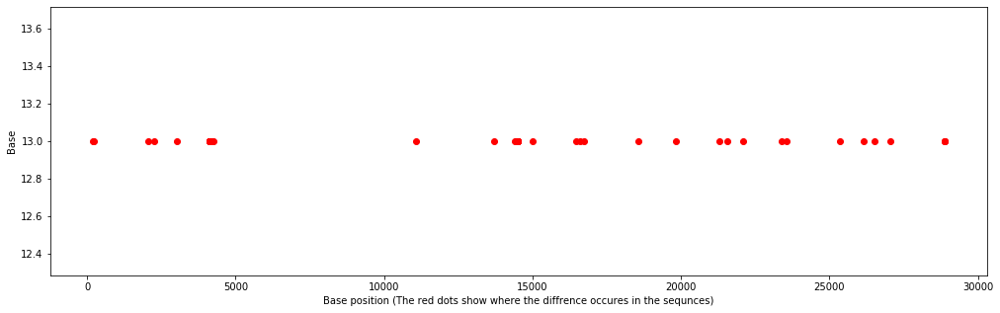

In [41]:
alignmentScore(italianMultiAlignment,colum,row)

### Mutation Percentage

In [42]:
# we choose Consensus sequnece as refrence sequence
refSeq=findConsensus(italianMultiAlignment,colum,row)
mutationPercent(italianMultiAlignment,colum,row,refSeq)

28884 >> 30.8 %
28885 >> 30.8 %
28886 >> 30.8 %
241 >> 15.4 %
3037 >> 15.4 %
11083 >> 15.4 %
14408 >> 15.4 %
23403 >> 15.4 %
26147 >> 15.4 %
26533 >> 15.4 %
187 >> 7.7 %
2062 >> 7.7 %
2269 >> 7.7 %
4131 >> 7.7 %
4132 >> 7.7 %
4133 >> 7.7 %
4134 >> 7.7 %
4135 >> 7.7 %
4136 >> 7.7 %
4137 >> 7.7 %
4138 >> 7.7 %
4139 >> 7.7 %
4140 >> 7.7 %
4141 >> 7.7 %
4142 >> 7.7 %
4143 >> 7.7 %
4144 >> 7.7 %
4145 >> 7.7 %
4146 >> 7.7 %
4147 >> 7.7 %
4148 >> 7.7 %
4149 >> 7.7 %
4255 >> 7.7 %
13703 >> 7.7 %
14487 >> 7.7 %
14488 >> 7.7 %
14489 >> 7.7 %
14490 >> 7.7 %
14491 >> 7.7 %
14492 >> 7.7 %
14493 >> 7.7 %
14494 >> 7.7 %
14495 >> 7.7 %
14496 >> 7.7 %
14497 >> 7.7 %
14498 >> 7.7 %
14499 >> 7.7 %
14500 >> 7.7 %
14501 >> 7.7 %
15017 >> 7.7 %
16456 >> 7.7 %
16593 >> 7.7 %
16727 >> 7.7 %
18568 >> 7.7 %
19839 >> 7.7 %
21293 >> 7.7 %
21575 >> 7.7 %
22099 >> 7.7 %
23575 >> 7.7 %
25340 >> 7.7 %
27049 >> 7.7 %


## Italian With Chinese as Ref

In [43]:
# Redigne Multialignmet file that we've generated
italianWithChineseMultiAlignment = AlignIO.read("MiltiAlignment Files\Italian with chinese.aln", "clustal")

print("Alignment length %i" % italianWithChineseMultiAlignment.get_alignment_length())
print("Samples",np.size(italianWithChineseMultiAlignment,0)-1,)
print("\n")
for record in italianWithChineseMultiAlignment:
    print("%s - %s" % (record.seq, record.id))
np.size(italianWithChineseMultiAlignment,1)
#testAlignment[1,91]


Alignment length 29906
Samples 13


ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAA

29906

### Mutation Percentage

In [44]:

# we choose Chinese sequnece as refrence sequence
for record in italianWithChineseMultiAlignment:
    s="%s" % (record.id)
    if s=='NC_045512.2':
        chineseSeq="%s" % (record.seq)
        break

refSeq=chineseSeq
mutationPercent(italianWithChineseMultiAlignment,colum,row,refSeq)

241 >> 76.9 %
3037 >> 76.9 %
14408 >> 76.9 %
23403 >> 76.9 %
28884 >> 30.8 %
28885 >> 30.8 %
28886 >> 30.8 %
11083 >> 15.4 %
26147 >> 15.4 %
26533 >> 15.4 %
187 >> 7.7 %
2269 >> 7.7 %
4131 >> 7.7 %
4132 >> 7.7 %
4133 >> 7.7 %
4134 >> 7.7 %
4135 >> 7.7 %
4136 >> 7.7 %
4137 >> 7.7 %
4138 >> 7.7 %
4139 >> 7.7 %
4140 >> 7.7 %
4141 >> 7.7 %
4142 >> 7.7 %
4143 >> 7.7 %
4144 >> 7.7 %
4145 >> 7.7 %
4146 >> 7.7 %
4147 >> 7.7 %
4148 >> 7.7 %
4149 >> 7.7 %
4255 >> 7.7 %
13703 >> 7.7 %
14487 >> 7.7 %
14488 >> 7.7 %
14489 >> 7.7 %
14490 >> 7.7 %
14491 >> 7.7 %
14492 >> 7.7 %
14493 >> 7.7 %
14494 >> 7.7 %
14495 >> 7.7 %
14496 >> 7.7 %
14497 >> 7.7 %
14498 >> 7.7 %
14499 >> 7.7 %
14500 >> 7.7 %
14501 >> 7.7 %
15017 >> 7.7 %
16456 >> 7.7 %
16593 >> 7.7 %
16727 >> 7.7 %
18568 >> 7.7 %
19839 >> 7.7 %
21293 >> 7.7 %
21575 >> 7.7 %
22099 >> 7.7 %
23575 >> 7.7 %
25340 >> 7.7 %
27049 >> 7.7 %


# Italian + German 

In [45]:
# Redigne Multialignmet file that we've generated
italianAndGermanMultiAlignment = AlignIO.read("MiltiAlignment Files\Italian & German.aln", "clustal")

print("Alignment length %i" % italianAndGermanMultiAlignment.get_alignment_length())
print("Samples",np.size(italianAndGermanMultiAlignment,0)-1,)
print("\n")
for record in italianAndGermanMultiAlignment:
    print("%s - %s" % (record.seq, record.id))
np.size(italianAndGermanMultiAlignment,1)
#testAlignment[1,91]

Alignment length 29906
Samples 89


--TRAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGAKCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCATGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAA

29906

### Finding concensus

In [46]:
colum=np.size (italianAndGermanMultiAlignment,1)
row=np.size (italianAndGermanMultiAlignment,0)

s=findConsensus(italianAndGermanMultiAlignment,colum,row)
#print(s[5])
print(findConsensus(italianAndGermanMultiAlignment,colum,row),'| Consensus')

------------------------------------------------------AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTTGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAACATGAGCATGAAATTGCTTGGTACACGGAACGTTCT

### Finding mutation

4 : RAAAAAAA-----A---------------------------------------------------------------A--A-A-------
160 : GGGGGGGAGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
187 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAGAAA
210 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGKGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
241 : CCTTCTTTTTTTTTTTTTTTTTTCTTCTTTCTTTTTTCTTTCTTTCTTTTTTTTTTTTTCCYCTTTTCCCCCCCCCCTTTTCCTTTTTTT
514 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTYTTTTTTTTTTTTTTT-TTTTTTTTTTTT
658 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTCTCCTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
675 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
682 : KTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
884 : TCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
900 : CCCCCCCCCCCCCCCCCCCCCCCCCC

4838 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAAAAAAAAAAAAAAA
4839 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTTTTTTTTTTTTTTT
4840 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAAAAAAAAAAAAAAA
4841 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNGGGGGGGGGGGGGGGGGGG
4842 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAAAAAAAAAAAAAAA
4843 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAAAAAAAAAAAAAAAAAA
4844 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTTTTTTTTTTTTTTT
4845 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTTTTTTTTTTTTTTT
4846 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNTTTTTTTTTTTTTTTTTTT
4847 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCCCCCCCCCCCCCCCCCC
4848 : TTTTTTTTTTTTT

5293 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTTTTTTTTTTTTTTTTTT
5294 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGG
5295 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCCCCCCCCCCCCCCC
5296 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCCCCCCCCCCCCCCC
5297 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAANANAAAAAANAAAAAAAAAAAAAAAAAAAAAAAANNNAANANANAAAAAAAAAAAAAAA
5298 : CCCCCCCCCCCCCCCCCCCCCCNNNNNCCCCNCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNNCCNCNCNCCCCCCCCCCCCCCC
5299 : TTTTTTTTTTTTTTTTTTTTTTNNNNNTTTTNTNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTNTTTTTTTTTTTTTTT
5300 : GGGGGGGGGGGGGGGGGGGGGGNNNNNGGGGNGNGGGGGGNGGGGGGGGGGGGGGGGGGGGGGGGNNNGGNGNGNGGGGGGGGGGGGGGG
5301 : CCCCCCCCCCCCCCCCCCCCCCNNNNNCCCCNCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNNCCNCNCNCCCCCCCCCCCCCCC
5302 : AAAAAAAAAAAAAAAAAAAAAANNNNNAAAANANAAAAAANAAAAAAAAAAAAAAAAAAAAAAAANNNAANANANAAAAAAAAAAAAAAA
5303 : TTTTTTTTTTTTT

5517 : TTTTTTTTTTTTTTTTTTTTTTNNNNNTTTTNTNTTTTTTNTTTTTTTTTTTTTTTTTTTTTTTTNNTTTNTTTNTTTTTTTTTTTTTTT
5518 : GGGGGGGGGGGGGGGGGGGGGGNNNNNGGGGNGNGGGGGGNGGGGGGGGGGGGGGGGGGGGGGGGNNGGGNGGGNGGGGGGGGGGGGGGG
5519 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTNTNTTTTTTNTTTTTTTTTTTTTTTTTTTTTTTTNNTTTNTTTNTTTTTTTTTTTTTTT
5520 : GGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGNGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGGGGNNGGGNGGGNGGGGGGGGGGGGGGG
5521 : TTTTTTTTTTTTTTTTTTTTTTNNNNNTTTTNTTTTTTTTNTTTTTTTTTTTTTTTTTTTTTTTTNNTTTNTTTNTTTTTTTTTTTTTTT
5522 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAANANAAAAAANAAAAAAAAAAAAAAAAAAAAAAAANNAAANAAANAAAAAAAAAAAAAAA
5523 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAANANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAANAAANAAAAAAAAAAAAAAA
5524 : AAAAAAAAAAAAAAAAAAAAAANNNNNAAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAANAAANAAAAAAAAAAAAAAA
5525 : AAAAAAAAAAAAAAAAAAAAAANNNNNAAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNAAANAAANAAAAAAAAAAAAAAA
5526 : CCCCCCCCCCCCCCCCCCCCCCNNNNNCCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNCCCNCCCNCCCCCCCCCCCCCCC
5527 : TTTTTTTTTTTTT

9891 : CCCCCCCCCYCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
10356 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
10524 : CTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
10969 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCYCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
11083 : GGGGGGGGGGGGGGGGGGGGGGGNGGGGGGNGGGGGGGGGGNGGGKGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGTNGGGGGGG
11182 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTCTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
11638 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTCTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
12704 : GTGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
12715 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAARAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
12797 : GAGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
13225 : CCC

19839 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTCTTTTTTTTT
20020 : TTTTTTTTTTTTTTTTTTTTTYTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTT
20887 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGAGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
21137 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
21293 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTYTTT
21372 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGKGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGG
21575 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCCC
21627 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
21635 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCCCCCC
21707 : TCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
22099 : TT

22454 : GGGGGGGGGGGGGGGGGGGGGGNNNNGNGGGNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGGG
22455 : AAAAAAAAAAAAAAAAAAAAAANNANANAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAAAAAAAAAAAAAAAA
22456 : AAAAAAAAAAAAAAAAAAAAAANNANANAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAAAAAAAAAAAAAAAA
22457 : AAAAAAAAAAAAAAAAAAAAAANNANANAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAAAAAAAAAAAAAAAA
22458 : CCCCCCCCCCCCCCCCCCCCCCNNCNCNCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCCCCCCCCCCCCCCCC
22459 : AAAAAAAAAAAAAAAAAAAAAANNANANAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAAAAAAAAAAAAAAAA
22460 : AAAAAAAAAAAAAAAAAAAAAANNANANAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAAAAAAAAAAAAAAAA
22461 : AAAAAAAAAAAAAAAAAAAAAANNANANAAANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAAAAAAAAAAAAAAAA
22462 : GGGGGGGGGGGGGGGGGGGGGGNNGNGNGGGNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGGGGGGGGGGGG
22463 : TTTTTTTTTTTTTTTTTTTTTTNNTNTNTTTNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTTTTTTTTTTTTTTTTTTT
22464 : GG

22878 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
22879 : CCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNNCCNCNCCCCCCCCCCCCCCCCC
22880 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
22881 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
22882 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
22883 : CCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNNCCNCNCCCCCCCCCCCCCCCCC
22884 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
22885 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
22886 : GGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNNGGNGNGGGGGGGGGGGGGGGGG
22887 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
22888 : TT

23002 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
23003 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
23004 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
23005 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
23006 : GGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNNGGNGNGGGGGGGGGGGGGGGGG
23007 : GGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNNGGNGNGGGGGGGGGGGGGGGGG
23008 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
23009 : GGGGGGGGGGGGGGGGGGGGGGNNNNNNGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNNNGGNGNGGGGGGGGGGGGGGGGG
23010 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
23011 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
23012 : GG

23140 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANAAAAAAAAAAAAAAAAA
23141 : CCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNNCCNCNCCCCCCCCCCCCCCCCC
23142 : CCCCCCCCCCCCCCCCCCCCCCNNNNNNCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNNNCCNCNCCCCCCCCCCCCCCCCC
23143 : TTTTTTTTTTTTTTTTTTTTTTNNNNNNTTTNTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNNNTTNTNTTTTTTTTTTTTTTTTT
23144 : AAAAAAAAAAAAAAAAAAAAAANNNNNNAAANANAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANNNAANANANAAAAAAAAAAAAAAA
23179 : CCCCCCYCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
23235 : AAAAGAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAA
23403 : AAGGAGGGGGGGGGGGGGGGGGGAGGAGGGAGGGGGGAGGGAGGGRGGGGGGGGGGGGGAARAGGGGAAAAAAAAAAGGGGAAGGGGGGG
23575 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCTCC
23683 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCYCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC
24796 : TT

29803 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGGGGG
29804 : CCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCCNCCCCCCCCCCCCC
29810 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTTTTTNTTTTTTTTTTTTT
29811 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGGGGGNGGGGGGGGGGGGG
29813 : GGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGGNGGGGGG--GGGGG
29814 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTT--TTTTT
29815 : AAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAANAAAAAAAAANAAAAAA--AAAAA
29819 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTT--TTTTT
29823 : TTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTTNTTTTTTTTTTTTTTTT--TTTTT
29838 : CCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCNCCCCCCCCC-CCCCCC--CCCCC
29873 : CC

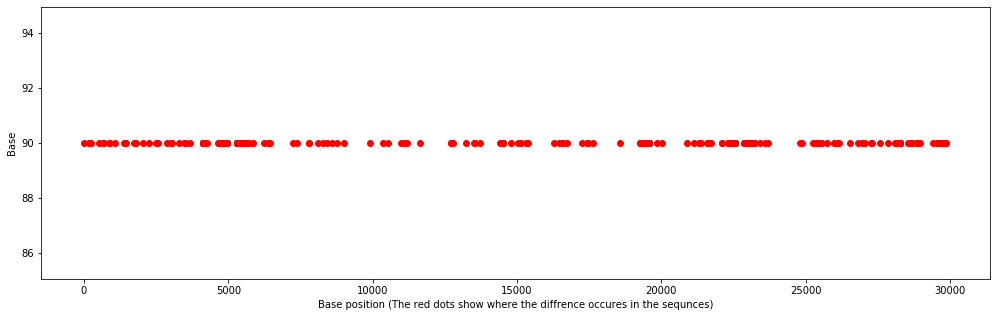

In [47]:
alignmentScore(italianAndGermanMultiAlignment,colum,row)

### Mutation Percentage

In [48]:
# we choose Consensus sequnece as refrence sequence
refSeq=findConsensus(italianAndGermanMultiAlignment,colum,row)
mutationPercent(italianAndGermanMultiAlignment,colum,row,refSeq)

14408 >> 43.3 %
241 >> 27.8 %
3037 >> 27.8 %
23403 >> 27.8 %
1059 >> 25.6 %
25563 >> 25.6 %
1440 >> 16.7 %
2891 >> 16.7 %
5297 >> 16.7 %
5303 >> 16.7 %
5304 >> 16.7 %
5305 >> 16.7 %
5313 >> 16.7 %
5314 >> 16.7 %
5336 >> 16.7 %
28884 >> 16.7 %
28885 >> 16.7 %
28886 >> 16.7 %
5300 >> 15.6 %
5302 >> 15.6 %
5308 >> 15.6 %
5311 >> 15.6 %
5318 >> 15.6 %
5319 >> 15.6 %
5324 >> 15.6 %
5325 >> 15.6 %
5330 >> 15.6 %
5331 >> 15.6 %
5332 >> 15.6 %
5338 >> 15.6 %
5342 >> 15.6 %
5343 >> 15.6 %
5344 >> 15.6 %
5345 >> 15.6 %
5349 >> 15.6 %
5350 >> 15.6 %
5354 >> 15.6 %
5356 >> 15.6 %
5359 >> 15.6 %
5360 >> 15.6 %
5361 >> 15.6 %
5369 >> 15.6 %
5371 >> 15.6 %
5393 >> 15.6 %
5498 >> 15.6 %
23104 >> 15.6 %
23144 >> 15.6 %
5298 >> 14.4 %
5299 >> 14.4 %
5301 >> 14.4 %
5306 >> 14.4 %
5307 >> 14.4 %
5309 >> 14.4 %
5310 >> 14.4 %
5312 >> 14.4 %
5315 >> 14.4 %
5316 >> 14.4 %
5317 >> 14.4 %
5320 >> 14.4 %
5321 >> 14.4 %
5322 >> 14.4 %
5323 >> 14.4 %
5326 >> 14.4 %
5327 >> 14.4 %
5328 >> 14.4 %
5329 >> 14.4 %
533

19343 >> 8.9 %
19345 >> 8.9 %
19346 >> 8.9 %
19347 >> 8.9 %
19348 >> 8.9 %
19349 >> 8.9 %
19350 >> 8.9 %
19351 >> 8.9 %
19352 >> 8.9 %
19353 >> 8.9 %
19354 >> 8.9 %
19355 >> 8.9 %
19356 >> 8.9 %
19357 >> 8.9 %
19358 >> 8.9 %
19359 >> 8.9 %
19360 >> 8.9 %
19361 >> 8.9 %
19362 >> 8.9 %
19363 >> 8.9 %
19364 >> 8.9 %
19365 >> 8.9 %
19366 >> 8.9 %
19367 >> 8.9 %
19368 >> 8.9 %
19369 >> 8.9 %
19370 >> 8.9 %
19371 >> 8.9 %
19372 >> 8.9 %
19373 >> 8.9 %
19374 >> 8.9 %
19375 >> 8.9 %
19376 >> 8.9 %
19377 >> 8.9 %
19378 >> 8.9 %
19379 >> 8.9 %
19380 >> 8.9 %
19381 >> 8.9 %
19382 >> 8.9 %
19383 >> 8.9 %
19384 >> 8.9 %
19385 >> 8.9 %
19386 >> 8.9 %
19387 >> 8.9 %
19388 >> 8.9 %
19389 >> 8.9 %
19390 >> 8.9 %
19391 >> 8.9 %
19392 >> 8.9 %
19395 >> 8.9 %
19396 >> 8.9 %
19397 >> 8.9 %
19398 >> 8.9 %
19399 >> 8.9 %
19400 >> 8.9 %
19401 >> 8.9 %
19402 >> 8.9 %
19403 >> 8.9 %
19404 >> 8.9 %
19405 >> 8.9 %
19406 >> 8.9 %
19407 >> 8.9 %
19408 >> 8.9 %
19409 >> 8.9 %
19410 >> 8.9 %
19411 >> 8.9 %
19412 >> 8

14489 >> 1.1 %
14490 >> 1.1 %
14491 >> 1.1 %
14492 >> 1.1 %
14493 >> 1.1 %
14494 >> 1.1 %
14495 >> 1.1 %
14496 >> 1.1 %
14497 >> 1.1 %
14498 >> 1.1 %
14499 >> 1.1 %
14500 >> 1.1 %
14501 >> 1.1 %
15017 >> 1.1 %
15152 >> 1.1 %
15324 >> 1.1 %
16289 >> 1.1 %
16456 >> 1.1 %
16575 >> 1.1 %
16593 >> 1.1 %
16727 >> 1.1 %
17247 >> 1.1 %
17423 >> 1.1 %
17443 >> 1.1 %
17470 >> 1.1 %
17635 >> 1.1 %
18568 >> 1.1 %
20020 >> 1.1 %
20887 >> 1.1 %
21137 >> 1.1 %
21293 >> 1.1 %
21372 >> 1.1 %
21575 >> 1.1 %
21627 >> 1.1 %
21635 >> 1.1 %
21707 >> 1.1 %
22099 >> 1.1 %
22104 >> 1.1 %
23179 >> 1.1 %
23235 >> 1.1 %
23575 >> 1.1 %
23683 >> 1.1 %
24796 >> 1.1 %
25250 >> 1.1 %
25340 >> 1.1 %
25429 >> 1.1 %
25466 >> 1.1 %
25722 >> 1.1 %
25978 >> 1.1 %
26091 >> 1.1 %
26804 >> 1.1 %
26939 >> 1.1 %
27275 >> 1.1 %
27302 >> 1.1 %
27580 >> 1.1 %
27852 >> 1.1 %
28104 >> 1.1 %
28147 >> 1.1 %
28225 >> 1.1 %
28226 >> 1.1 %
28227 >> 1.1 %
28228 >> 1.1 %
28229 >> 1.1 %
28230 >> 1.1 %
28231 >> 1.1 %
28232 >> 1.1 %
28233 >> 1

## German+Italian With Chinese as Ref

In [49]:
# Redigne Multialignmet file that we've generated
italianAndGermanWithChineseMultiAlignment = AlignIO.read("MiltiAlignment Files\Italian & German with chinese.aln", "clustal")

print("Alignment length %i" % italianAndGermanWithChineseMultiAlignment.get_alignment_length())
print("Samples",np.size(italianAndGermanWithChineseMultiAlignment,0)-1,)
print("\n")
for record in italianAndGermanWithChineseMultiAlignment:
    print("%s - %s" % (record.seq, record.id))
np.size(italianAndGermanWithChineseMultiAlignment,1)
#testAlignment[1,91]


Alignment length 29906
Samples 90


ATTAAAGGTTTATACCTTCCCAGGTAACAAACCAACCAACTTTCGATCTCTTGTAGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTCGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCTCGTACGTGGCTTTGGAGACTCCGTGGAGGAGGTCTTATCAGAGGCACGTCAACATCTTAAAGATGGCACTTGTGGCTTAGTAGAAGTTGAAAAAGGCGTTTTGCCTCAACTTGAACAGCCCTATGTGTTCATCAAACGTTCGGATGCTCGAACTGCACCTCATGGTCATGTTATGGTTGAGCTGGTAGCAGAACTCGAAGGCATTCAGTACGGTCGTAGTGGTGAGACACTTGGTGTCCTTGTCCCTCATGTGGGCGAAATACCAGTGGCTTACCGCAAGGTTCTTCTTCGTAAGAACGGTAATAAAGGAGCTGGTGGCCATAGTTACGGCGCCGATCTAAAGTCATTTGACTTAGGCGACGAGCTTGGCACTGATCCTTATGAAGATTTTCAAGAAAACTGGAACACTAAACATAGCAGTGGTGTTACCCGTGAACTCATGCGTGAGCTTAACGGAGGGGCATACACTCGCTATGTCGATAACAACTTCTGTGGCCCTGATGGCTACCCTCTTGAGTGCATTAAAGACCTTCTAGCACGTGCTGGTAAAGCTTCATGCACTTTGTCCGAACAACTGGACTTTATTGACACTAAGAGGGGTGTATACTGCTGCCGTGAA

29906

### Mutation Percentage

In [50]:
# we choose Chinese sequnece as refrence sequence
for record in italianAndGermanWithChineseMultiAlignment:
    s="%s" % (record.id)
    if s=='NC_045512.2':
        chineseSeq="%s" % (record.seq)
        break

refSeq=chineseSeq
mutationPercent(italianAndGermanWithChineseMultiAlignment,colum,row,refSeq)

3037 >> 73.3 %
23403 >> 73.3 %
241 >> 72.2 %
14408 >> 57.8 %
1059 >> 25.6 %
25563 >> 25.6 %
1440 >> 16.7 %
2891 >> 16.7 %
5297 >> 16.7 %
5303 >> 16.7 %
5304 >> 16.7 %
5305 >> 16.7 %
5313 >> 16.7 %
5314 >> 16.7 %
5336 >> 16.7 %
28884 >> 16.7 %
28885 >> 16.7 %
28886 >> 16.7 %
5300 >> 15.6 %
5302 >> 15.6 %
5308 >> 15.6 %
5311 >> 15.6 %
5318 >> 15.6 %
5319 >> 15.6 %
5324 >> 15.6 %
5325 >> 15.6 %
5330 >> 15.6 %
5331 >> 15.6 %
5332 >> 15.6 %
5338 >> 15.6 %
5342 >> 15.6 %
5343 >> 15.6 %
5344 >> 15.6 %
5345 >> 15.6 %
5349 >> 15.6 %
5350 >> 15.6 %
5354 >> 15.6 %
5356 >> 15.6 %
5359 >> 15.6 %
5360 >> 15.6 %
5361 >> 15.6 %
5369 >> 15.6 %
5371 >> 15.6 %
5393 >> 15.6 %
5498 >> 15.6 %
23104 >> 15.6 %
23144 >> 15.6 %
5298 >> 14.4 %
5299 >> 14.4 %
5301 >> 14.4 %
5306 >> 14.4 %
5307 >> 14.4 %
5309 >> 14.4 %
5310 >> 14.4 %
5312 >> 14.4 %
5315 >> 14.4 %
5316 >> 14.4 %
5317 >> 14.4 %
5320 >> 14.4 %
5321 >> 14.4 %
5322 >> 14.4 %
5323 >> 14.4 %
5326 >> 14.4 %
5327 >> 14.4 %
5328 >> 14.4 %
5329 >> 14.4 %
533

19408 >> 8.9 %
19409 >> 8.9 %
19410 >> 8.9 %
19411 >> 8.9 %
19412 >> 8.9 %
19413 >> 8.9 %
19414 >> 8.9 %
19415 >> 8.9 %
19416 >> 8.9 %
19417 >> 8.9 %
19418 >> 8.9 %
19419 >> 8.9 %
19420 >> 8.9 %
19421 >> 8.9 %
19422 >> 8.9 %
19423 >> 8.9 %
19424 >> 8.9 %
19425 >> 8.9 %
19426 >> 8.9 %
19427 >> 8.9 %
19428 >> 8.9 %
19429 >> 8.9 %
19430 >> 8.9 %
19431 >> 8.9 %
19432 >> 8.9 %
19433 >> 8.9 %
19434 >> 8.9 %
19435 >> 8.9 %
19436 >> 8.9 %
19437 >> 8.9 %
19438 >> 8.9 %
19439 >> 8.9 %
19440 >> 8.9 %
19441 >> 8.9 %
19442 >> 8.9 %
19443 >> 8.9 %
19444 >> 8.9 %
19445 >> 8.9 %
19446 >> 8.9 %
19447 >> 8.9 %
19448 >> 8.9 %
19449 >> 8.9 %
19450 >> 8.9 %
19451 >> 8.9 %
19452 >> 8.9 %
19453 >> 8.9 %
19454 >> 8.9 %
19455 >> 8.9 %
19456 >> 8.9 %
19457 >> 8.9 %
19458 >> 8.9 %
19459 >> 8.9 %
19460 >> 8.9 %
19461 >> 8.9 %
19462 >> 8.9 %
19463 >> 8.9 %
19464 >> 8.9 %
19465 >> 8.9 %
19466 >> 8.9 %
19467 >> 8.9 %
19468 >> 8.9 %
19469 >> 8.9 %
19470 >> 8.9 %
19471 >> 8.9 %
19472 >> 8.9 %
19473 >> 8.9 %
19474 >> 8

29819 >> 1.1 %
29823 >> 1.1 %
29838 >> 1.1 %
29874 >> 1.1 %


According to a study Posted May 20, 2020 on biorxiv website(operated by Cold Spring Harbor Laboratory, a not-for-profit research and educational institution in USA), researchers identified mutations in the genome of severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2) that may have contributed to its dominance in Europe and elsewhere.

The results suggest that one mutation in particular – 14408C>T – (RdRP)is involved in increasing the mutation rate and possibly the transmissibility of the virus, And it has been identified in more than 7000 isolates from various continents
One early study of SARS-CoV-2 genomes isolated from North America and Europe suggested that 14408C>T is associated with a higher number of mutations, although the mechanism is not yet fully understood.

RNA-dependent RNA polymerase(RdRP) is an essential protein encoded in the genomes of all RNA-containing viruses. It's responsible for catalyzing the replication of RNA from an RNA template. 

Interestingly the authors describe two other mutations that co-evolved with 14408C>T, namely 23403A>G and 3037C>T. These two mutaions appeared in both  Italian and German samples in this project



They examined the relationships of the RdRp mutations with mutations found in M or E proteins (hereafter referred to as MoE).

بروتين إي المغلف هو بروتين غشائي صغير ومتكامل يشارك في العديد من جوانب دورة حياة الفيروس ، مثل التجميع ، والتبرعم ، وتكوين المغلف ، والإمراض

The CoV envelope (E) protein is a small, integral membrane protein involved in several aspects of the virus’ life cycle, such as assembly, budding, envelope formation, and pathogenesis. Recent studies have shown that SARS-CoV formation depends on either M and E proteins or M and N proteins.


Ref:  https://www.biorxiv.org/content/10.1101/2020.05.20.104885v1
